# 3. Coding the self-attention mechanism

## 3.3.1 A simplified self-attention mechanism without trainable weights

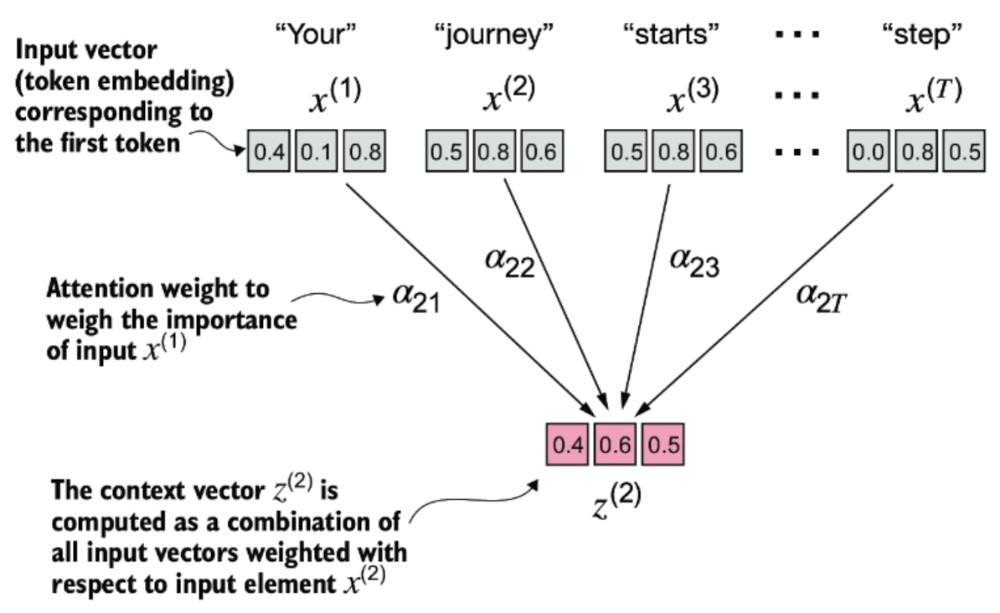

In [1]:
import torch
inputs = torch.tensor(
    [[0.43,0.15,0.89], # Your (x^1)
     [0.55,0.87,0.66], # journey  (x^2)
     [0.57,0.85,0.64], # start  (x^3)
     [0.22,0.58,0.33], # with (x^4)
     [0.77,0.25, 0.10], # one (x^5)
     [0.0,0.8,0.5] # step (x^6)
    ]
)

- First step in calculating the self attention is to calculate the intermediate values (w), called as `attention scores`.
  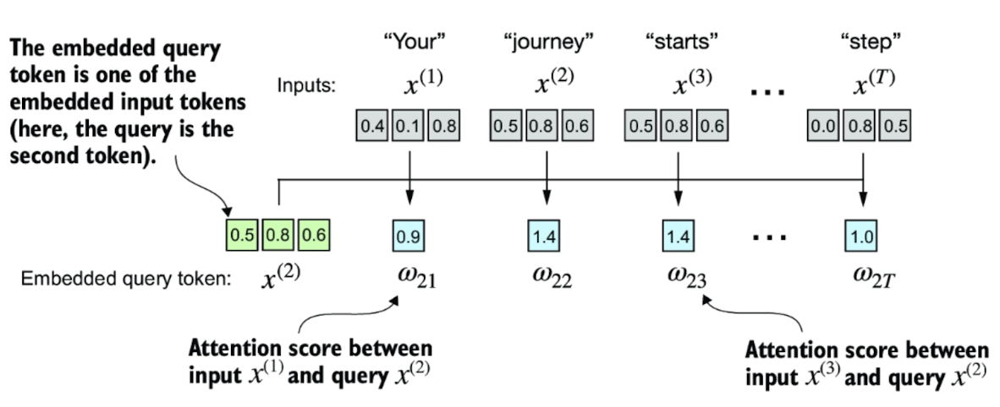

- The above figure shows how we calculate the intermediate attention scores between query $x^{(2)}$ and rest of the tokens.
- We determine these scores by **computing the dot product between query and every other input token**.


In [2]:
inputs.shape

torch.Size([6, 3])

In [3]:
query = inputs[1] # second input token serves as the query
attn_scores_2 = torch.empty(inputs.shape[0])
for i, x_i in enumerate(inputs):
    attn_scores_2[i] = torch.dot(x_i, query)
print(attn_scores_2)

tensor([0.9544, 1.4950, 1.4754, 0.8434, 0.7070, 1.0260])


-----

### Understanding the Dot product

- A dot product is concise way of multiplying the two vectors (element wise) and then summing up the product.

In [4]:
inputs[0]

tensor([0.4300, 0.1500, 0.8900])

In [5]:
query

tensor([0.5500, 0.8700, 0.6600])

In [6]:
res = 0
for idx, element in enumerate(inputs[0]):
    res += inputs[0][idx] * query[idx]
print("illustration of dot product", res)
print(torch.dot(inputs[0] , query))

illustration of dot product tensor(0.9544)
tensor(0.9544)


- Viewing the dot product :
- Beyond the mathematical operation that combine two vectors into the single scalar value.
- dot product measure the similarity between two vector because it quntifies how two vators are closely aligned. Larger dot product shows the greater degree of alignment or similarity.
- In context of the self attention mechanism, the dot product determines the extend of each element in the sequence "focuses on' or "attend to" any other element


-----

- In the next step we **normalize the attention scores**.

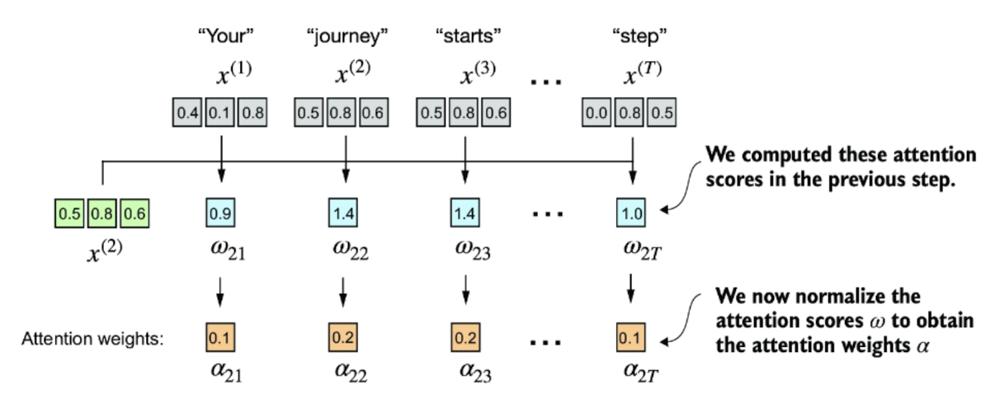

- The goal of the normalization to bring the **attention weights sums up to 1**.
- *This normalization is useful for interpretation and maintaining the training stability*.

In [7]:
attn_weights_2_tmp = attn_scores_2 / attn_scores_2.sum()
print("Attention weights", attn_weights_2_tmp)
print("\nSum", attn_weights_2_tmp.sum())

Attention weights tensor([0.1468, 0.2300, 0.2269, 0.1297, 0.1087, 0.1578])

Sum tensor(1.)


In [8]:
attn_scores_2

tensor([0.9544, 1.4950, 1.4754, 0.8434, 0.7070, 1.0260])

- The next is to obtain the attention weights for $a_{21}$ to $a_{2T}$
- In practice it is advisable to use the softmax to normalize.
- This is common and advisable to normalise with **softmax** as it handles well extreme values and it offer the favourable gradient during the training.

In [9]:
def softmax_naive(x):
    return torch.exp(x)/ torch.exp(x).sum(dim=0)

attn_weight_2_naive = softmax_naive(attn_scores_2)
print("Attention weigths naive", attn_weight_2_naive)
print("Sum", attn_weight_2_naive.sum())

Attention weigths naive tensor([0.1398, 0.2401, 0.2355, 0.1252, 0.1092, 0.1502])
Sum tensor(1.)


- The softmax also meets the objective of normalizing and sum is 1
- In addition softmax also make sure that attention weights are always possitive
- This makes the outputs interpretable as probabilities or relative importance, where higher values denote the greater importance.
- Also understand that softmax_naive may cause the numerical instabilities such as overflow and underflow, when dealing with the larger and smaller values. Therefore its advisable to use the Pytorch softmax which is highly optimised for performance.


In [10]:
attn_weights_2 = torch.softmax(attn_scores_2, dim=0)
print("Attention weights", attn_weights_2)
print("sum", attn_weights_2.sum())

Attention weights tensor([0.1398, 0.2401, 0.2355, 0.1252, 0.1092, 0.1502])
sum tensor(1.)


- Now that we have computed the attention weights we are ready for the next step: To calculate the context vector
  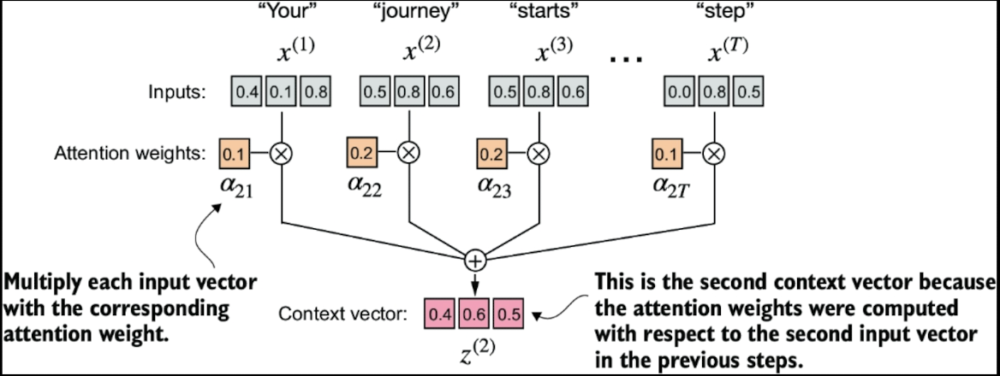

In [11]:
query = inputs[1] #The second input token
context_vec_2 = torch.empty(query.shape)
for i, x_i in enumerate(inputs):
    context_vec_2 += attn_weights_2[i] * x_i
print(context_vec_2)

tensor([0.4380, 0.6501, 0.5610])


In [12]:
query

tensor([0.5500, 0.8700, 0.6600])

In [13]:
context_vec_2

tensor([0.4380, 0.6501, 0.5610])

In [14]:
attn_weights_2

tensor([0.1398, 0.2401, 0.2355, 0.1252, 0.1092, 0.1502])

### 3.3.2 Computing the attention weights for all inputs

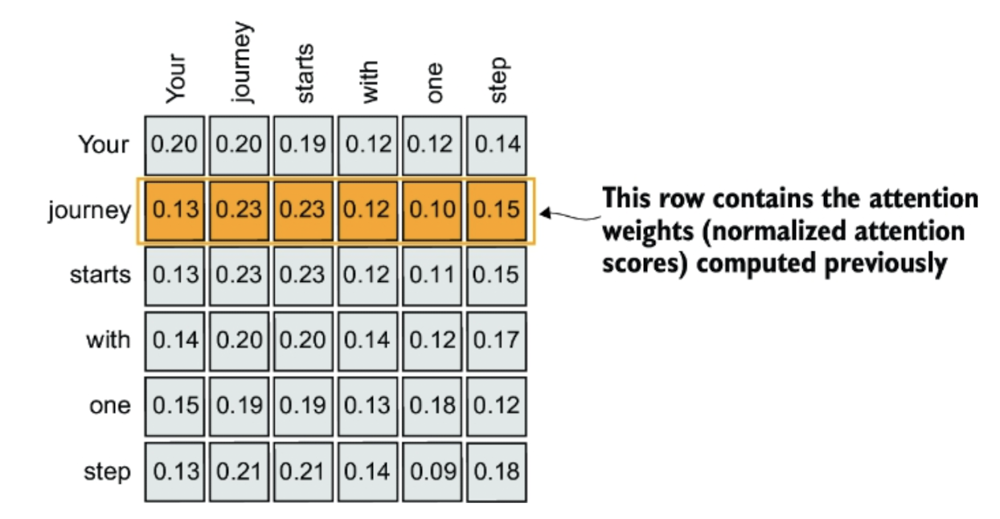

- We will compute the whole attention weights now

In [15]:
inputs

tensor([[0.4300, 0.1500, 0.8900],
        [0.5500, 0.8700, 0.6600],
        [0.5700, 0.8500, 0.6400],
        [0.2200, 0.5800, 0.3300],
        [0.7700, 0.2500, 0.1000],
        [0.0000, 0.8000, 0.5000]])

In [16]:
attn_scores = torch.empty(6,6)

for i, x_i in enumerate(inputs):
    for j, x_j in enumerate(inputs):
        attn_scores[i,j] = torch.dot(x_i,x_j)

print(attn_scores)


tensor([[0.9995, 0.9544, 0.9422, 0.4753, 0.4576, 0.5650],
        [0.9544, 1.4950, 1.4754, 0.8434, 0.7070, 1.0260],
        [0.9422, 1.4754, 1.4570, 0.8296, 0.7154, 1.0000],
        [0.4753, 0.8434, 0.8296, 0.4937, 0.3474, 0.6290],
        [0.4576, 0.7070, 0.7154, 0.3474, 0.6654, 0.2500],
        [0.5650, 1.0260, 1.0000, 0.6290, 0.2500, 0.8900]])


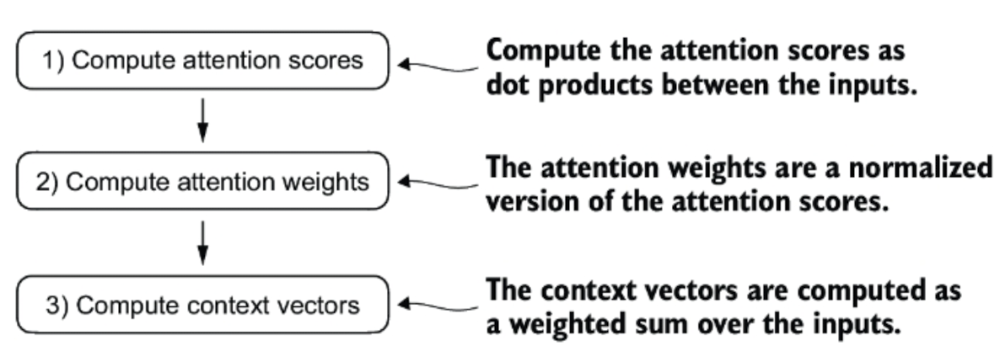

In [17]:
inputs

tensor([[0.4300, 0.1500, 0.8900],
        [0.5500, 0.8700, 0.6600],
        [0.5700, 0.8500, 0.6400],
        [0.2200, 0.5800, 0.3300],
        [0.7700, 0.2500, 0.1000],
        [0.0000, 0.8000, 0.5000]])

- for loop is slow so we will achieve the same results by matrix multiplication

In [18]:
attn_scores = inputs @ inputs.T
print(attn_scores)

tensor([[0.9995, 0.9544, 0.9422, 0.4753, 0.4576, 0.5650],
        [0.9544, 1.4950, 1.4754, 0.8434, 0.7070, 1.0260],
        [0.9422, 1.4754, 1.4570, 0.8296, 0.7154, 1.0000],
        [0.4753, 0.8434, 0.8296, 0.4937, 0.3474, 0.6290],
        [0.4576, 0.7070, 0.7154, 0.3474, 0.6654, 0.2500],
        [0.5650, 1.0260, 1.0000, 0.6290, 0.2500, 0.8900]])


In [19]:
# normalizing
attn_weights = torch.softmax(attn_scores, dim= 1)
print(attn_weights)

tensor([[0.2118, 0.2025, 0.2000, 0.1254, 0.1232, 0.1372],
        [0.1398, 0.2401, 0.2355, 0.1252, 0.1092, 0.1502],
        [0.1403, 0.2391, 0.2348, 0.1254, 0.1118, 0.1486],
        [0.1442, 0.2084, 0.2055, 0.1469, 0.1269, 0.1682],
        [0.1535, 0.1969, 0.1986, 0.1374, 0.1889, 0.1247],
        [0.1368, 0.2169, 0.2113, 0.1458, 0.0998, 0.1893]])


----

--- **Stablemax** --- (ICLR'25) -- helps in grokking (delayed generalization)--

***Normalization using the Stablemax (https://arxiv.org/pdf/2501.04697)***
- As we have discussed there is problem of overflow and underflow in case of large and small values of input
- https://github.com/LucasPrietoAl/grokking-at-the-edge-of-numerical-stability
  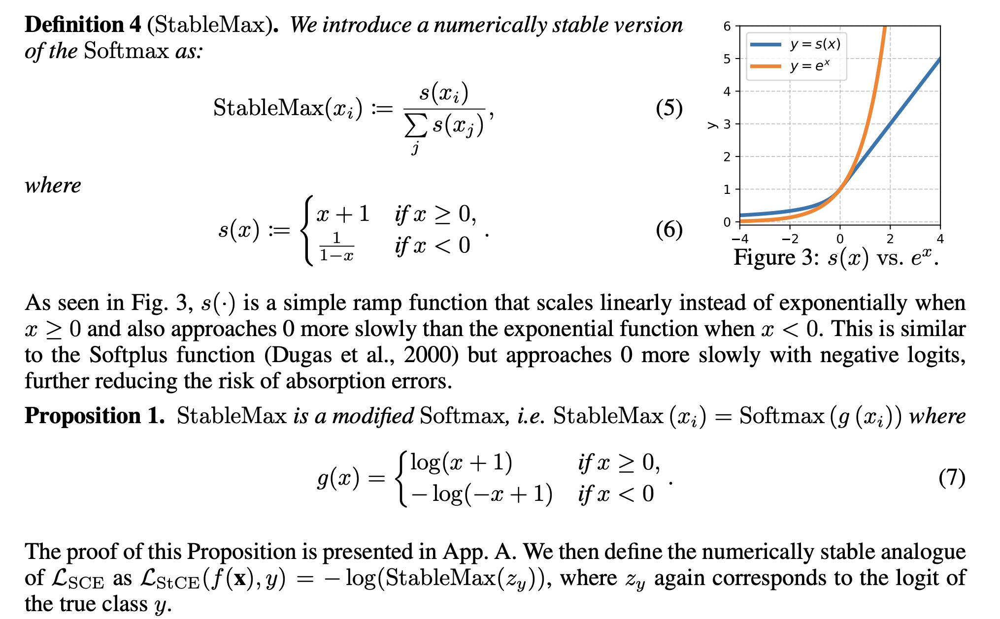

- both the above versions can be used
    - For faster implementation use linear transformation (x+1) and 1/(1-x)
    - For better compatibility use log(x+1) and -log(-x+1) as later we want to use other properties of softmax.
    - Here we will implement only the log version 

In [20]:
# transformation as mentioned above
def g(x):
    return torch.where(
        x>=0,
        torch.log(x+1),
        -torch.log(-x+1)
    )

In [21]:
# normalizing using the 
attn_weights_stablemax = torch.softmax(g(attn_scores), dim=1)
print(attn_weights_stablemax)
print(attn_weights_stablemax.sum(dim=1))

tensor([[0.1924, 0.1880, 0.1869, 0.1419, 0.1402, 0.1506],
        [0.1563, 0.1996, 0.1980, 0.1475, 0.1365, 0.1621],
        [0.1564, 0.1993, 0.1978, 0.1473, 0.1381, 0.1610],
        [0.1534, 0.1917, 0.1902, 0.1553, 0.1401, 0.1694],
        [0.1594, 0.1867, 0.1876, 0.1474, 0.1822, 0.1367],
        [0.1511, 0.1956, 0.1931, 0.1572, 0.1207, 0.1824]])
tensor([1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000])


In [22]:
print(attn_weights)
print(attn_weights.sum(dim=1))

tensor([[0.2118, 0.2025, 0.2000, 0.1254, 0.1232, 0.1372],
        [0.1398, 0.2401, 0.2355, 0.1252, 0.1092, 0.1502],
        [0.1403, 0.2391, 0.2348, 0.1254, 0.1118, 0.1486],
        [0.1442, 0.2084, 0.2055, 0.1469, 0.1269, 0.1682],
        [0.1535, 0.1969, 0.1986, 0.1374, 0.1889, 0.1247],
        [0.1368, 0.2169, 0.2113, 0.1458, 0.0998, 0.1893]])
tensor([1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000])


- Both follow the principle (sum =1) also you can see the difference ( as larger values are reduced and smaller values are still have not so small values)

---

- In the above we are normalising along the each row, i.e each row is sum 1.

In [23]:
attn_weights = torch.softmax(attn_scores,dim=-1)
print(attn_weights)

tensor([[0.2118, 0.2025, 0.2000, 0.1254, 0.1232, 0.1372],
        [0.1398, 0.2401, 0.2355, 0.1252, 0.1092, 0.1502],
        [0.1403, 0.2391, 0.2348, 0.1254, 0.1118, 0.1486],
        [0.1442, 0.2084, 0.2055, 0.1469, 0.1269, 0.1682],
        [0.1535, 0.1969, 0.1986, 0.1374, 0.1889, 0.1247],
        [0.1368, 0.2169, 0.2113, 0.1458, 0.0998, 0.1893]])


In [24]:
attn_scores.shape

torch.Size([6, 6])

- dim = -1, we are applying the normalization along the last dimension of attn_scores

In [25]:
row_2_sum = sum([0.1398, 0.2401, 0.2355, 0.1252, 0.1092, 0.1502])
print("row_2_sum",row_2_sum)
print("All rows sum", attn_weights.sum(dim=-1))

row_2_sum 0.9999999999999999
All rows sum tensor([1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000])


In [26]:
# context vector via matrix multiplication
all_context_vecs = attn_weights @ inputs
print(all_context_vecs)

tensor([[0.4389, 0.5912, 0.5724],
        [0.4380, 0.6501, 0.5610],
        [0.4393, 0.6482, 0.5598],
        [0.4238, 0.6290, 0.5426],
        [0.4632, 0.5898, 0.5202],
        [0.4075, 0.6498, 0.5529]])


In [27]:
# Contex vector with respect to the stablemax
all_context_vecs_stablemax = attn_weights_stablemax @ inputs
print(all_context_vecs)

tensor([[0.4389, 0.5912, 0.5724],
        [0.4380, 0.6501, 0.5610],
        [0.4393, 0.6482, 0.5598],
        [0.4238, 0.6290, 0.5426],
        [0.4632, 0.5898, 0.5202],
        [0.4075, 0.6498, 0.5529]])


In [28]:
attn_weights

tensor([[0.2118, 0.2025, 0.2000, 0.1254, 0.1232, 0.1372],
        [0.1398, 0.2401, 0.2355, 0.1252, 0.1092, 0.1502],
        [0.1403, 0.2391, 0.2348, 0.1254, 0.1118, 0.1486],
        [0.1442, 0.2084, 0.2055, 0.1469, 0.1269, 0.1682],
        [0.1535, 0.1969, 0.1986, 0.1374, 0.1889, 0.1247],
        [0.1368, 0.2169, 0.2113, 0.1458, 0.0998, 0.1893]])

In [29]:
attn_weights_stablemax

tensor([[0.1924, 0.1880, 0.1869, 0.1419, 0.1402, 0.1506],
        [0.1563, 0.1996, 0.1980, 0.1475, 0.1365, 0.1621],
        [0.1564, 0.1993, 0.1978, 0.1473, 0.1381, 0.1610],
        [0.1534, 0.1917, 0.1902, 0.1553, 0.1401, 0.1694],
        [0.1594, 0.1867, 0.1876, 0.1474, 0.1822, 0.1367],
        [0.1511, 0.1956, 0.1931, 0.1572, 0.1207, 0.1824]])

In [30]:
# comparing previous calculated context vector
print("Previously calculated context vector:", context_vec_2)

Previously calculated context vector: tensor([0.4380, 0.6501, 0.5610])


## 3.4 Implementing the Self-attention with trainable weights

- Self-attention also called `scaled dot product`
  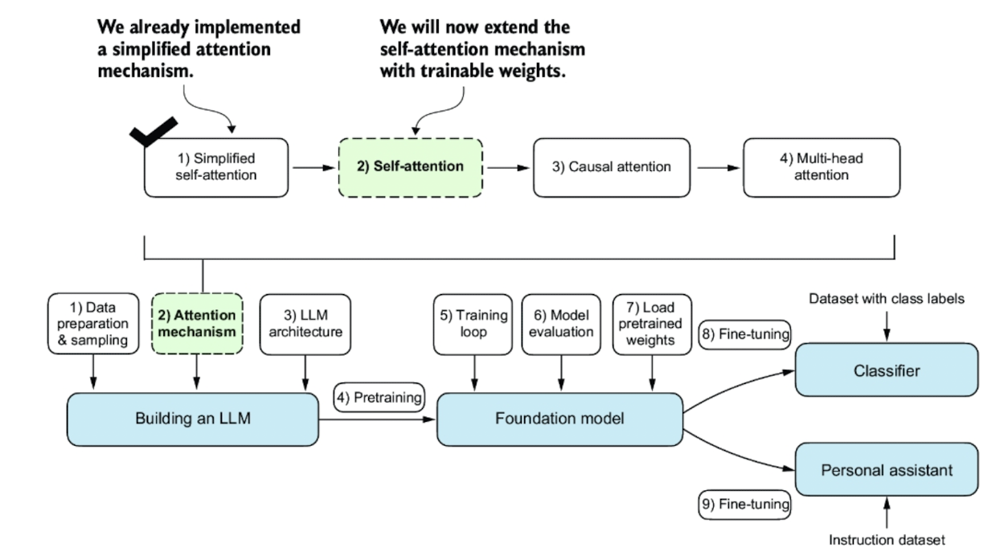

We will code the self attention mechanism into 2 steps:
1. Computing self attention weights step by step
2. compact self attention python class which could be imported in the LLM implementation

### 3.4.1 Computing the self attention weights step by step

We will introduce the 3 trainable weight matrices:
1. $W_q$
2. $W_k$
3. $W_v$ <br>
These 3 matrices used to project the embedded input tokens $x^{x_i}$, into query, key and value vectors respectively.
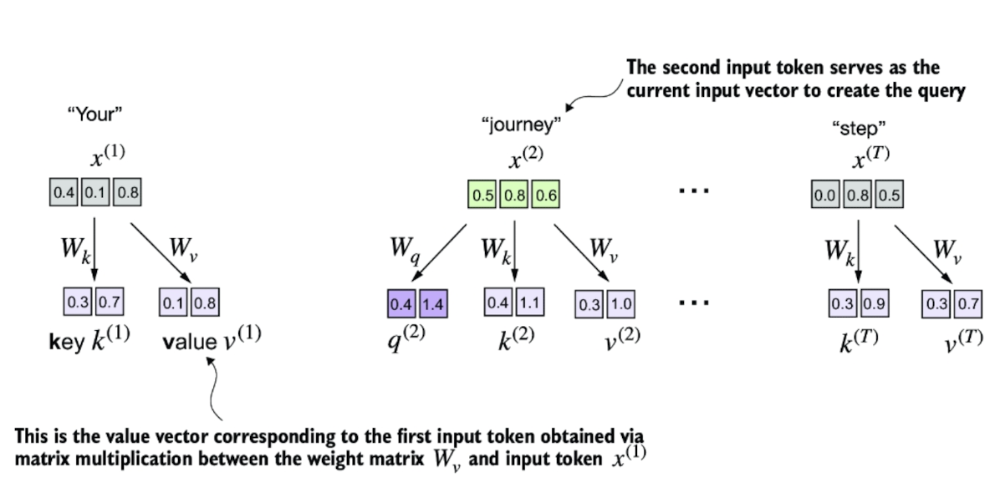

Here also we will calculate the context vector for $x(2)$ i.e. journey.


In [31]:
import torch
inputs = torch.tensor(
    [[0.43,0.15,0.89], # Your (x^1)
     [0.55,0.87,0.66], # journey  (x^2)
     [0.57,0.85,0.64], # start  (x^3)
     [0.22,0.58,0.33], # with (x^4)
     [0.77,0.25, 0.10], # one (x^5)
     [0.0,0.8,0.5] # step (x^6)
    ]
)

In [32]:
inputs

tensor([[0.4300, 0.1500, 0.8900],
        [0.5500, 0.8700, 0.6600],
        [0.5700, 0.8500, 0.6400],
        [0.2200, 0.5800, 0.3300],
        [0.7700, 0.2500, 0.1000],
        [0.0000, 0.8000, 0.5000]])

In [33]:
x_2 = inputs[1] # The second input element
d_in = inputs.shape[1] # The input embedding size, d=3
d_out = 2 # The output embedding size # in GPT usually d_in and d_out are same but we keep sepration now

In [34]:
inputs.shape

torch.Size([6, 3])

In [35]:
d_in

3

We will initialize the 3 weight matrices:<br>
$W_q$,$W_k$ and $W_v$

In [36]:
torch.manual_seed(123)
w_query = torch.nn.Parameter(torch.rand(d_in,d_out), requires_grad=False) # 3*2
w_key = torch.nn.Parameter(torch.rand(d_in,d_out), requires_grad=False)
w_value =torch.nn.Parameter(torch.rand(d_in,d_out), requires_grad=False) # for simplicity we kept the required_grad =False now but we will update it later

In [37]:
query_2 = x_2 @ w_query # (1*3) x (3*2) = (1*2)
key_2 = x_2 @ w_key
value = x_2 @ w_value
print(query_2) # 1*2

tensor([0.4306, 1.4551])


---

### Weight Parameters vs. Attention weights

W is the weight Parameters, the values of neural network and will be optimised during training. This should not be confused with attention weights.Attention weights are dynamic, context specific values.
- We reuires the key and value vectors for all inputs even for the z(2) also

In [38]:
keys = inputs @ w_key
values = inputs @ w_value
print(keys.shape)
print(values.shape)

torch.Size([6, 2])
torch.Size([6, 2])


- Now next step is to calculate the Attention scores
  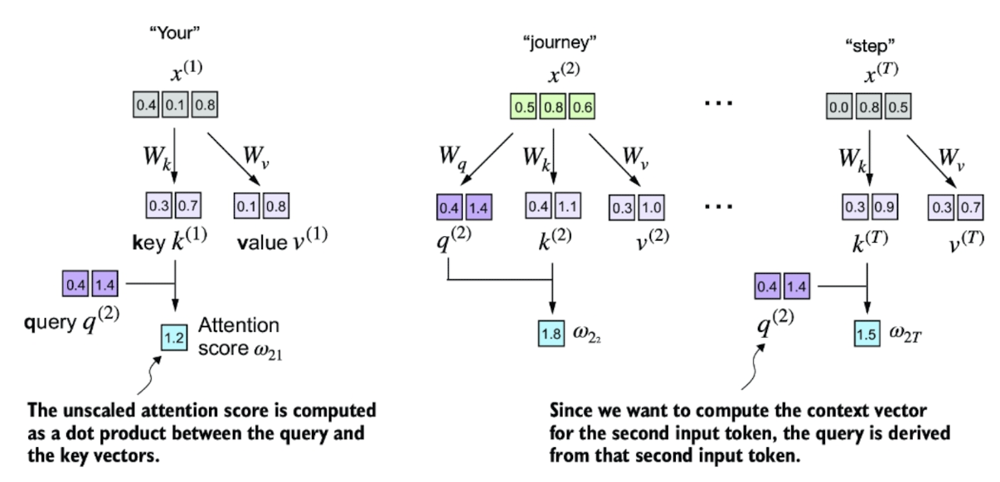

- Attention score computation is the dot product computation
- The only difference is that we are not computing the dot product between the input elements but using the query and key obtained by transforming the inputs via respective weight matrices.
- First let's compute the attention scores $w_{22}$

In [39]:
keys_2 = keys[1]
attention_scores_22 =query_2.dot(keys_2)
print(attention_scores_22)

tensor(1.8524)


 We can generalize using the matrix multiplication

In [40]:
keys_2 = keys[1]
attention_scores_2 =query_2 @ keys.T
print(attention_scores_2) # All attention scores for the query_2

tensor([1.2705, 1.8524, 1.8111, 1.0795, 0.5577, 1.4768])


- The results are unnormalised attention scores
- **So we want to go from Attention scores to Attention weights**
- We compute the attention weights using the softmax.
- However now we scale the attention scores by deviding them by square root of the embedding dimentions of the keys.
- Taking the square root is same as the exponentiating by 0.5 mathematically)

In [41]:
d_k = keys.shape[-1] # keys.shape (6,2) , taking last dim = 2 (d=2)

In [42]:
attn_scores_2/d_k**0.5

tensor([0.6749, 1.0571, 1.0433, 0.5964, 0.4999, 0.7255])

In [43]:
d_k = keys.shape[-1] # keys.shape (6,2) , taking last dim = 2 (d=2)
attention_weights_2 =torch.softmax(attn_scores_2/d_k**0.5, dim=-1)
print(attention_weights_2)

tensor([0.1487, 0.2179, 0.2149, 0.1374, 0.1248, 0.1564])


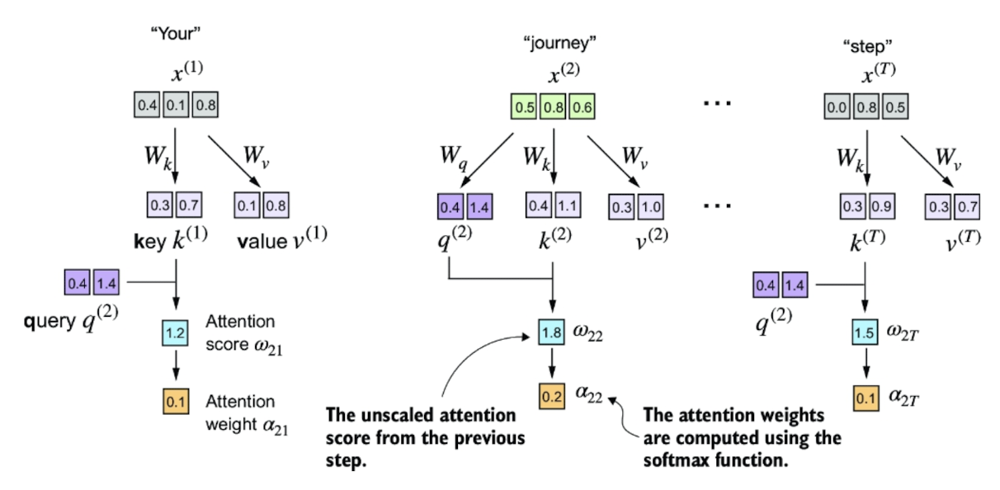

***The Rationale Behind the Scaled dot product*** <br>
- The reason for normalization by the embedding dimension to improve the training performance, by avoiding the small gradient.
- For instance, when scaling up the embedding dimension when typically greater then 1000 for GPT like LLMs, large dot product can leads to very small gradients durning the backpropagation due to softmax function is applied to them.
- As the dot product increases, the softmax function behaves as the step function, resulting the gradient nearly zero.
- These small gradient can drastiacally slow down the training or cause training process to stagnate.<br/>
***The scaling by the square root of the embedding dimension is the reason why `self-attention` also called as `scaled dot product attention`***

Next we will compute the context vector:

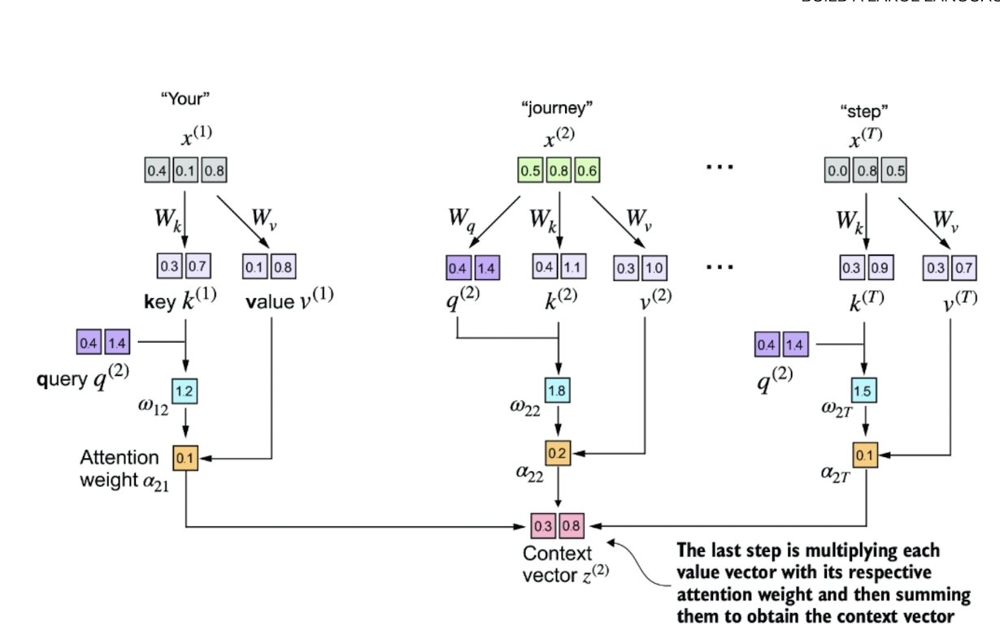

- Similar to we computed the context vector in 3.3 section as the weighted sum of the input vectors, Now we will compute the context vector as the weighted sum of the value vectors.
- Here attention weights serves as the weighting factor that weighs respective importance of the value vector.
- Also as before, we can obtain the output by matrix multiplication in one step:

In [44]:
attn_weights_2 #(1*6)

tensor([0.1398, 0.2401, 0.2355, 0.1252, 0.1092, 0.1502])

In [45]:
values # 6*2

tensor([[0.1855, 0.8812],
        [0.3951, 1.0037],
        [0.3879, 0.9831],
        [0.2393, 0.5493],
        [0.1492, 0.3346],
        [0.3124, 0.7351]])

In [46]:
context_vec_2 = attn_weights_2 @ values
print(context_vec_2)

tensor([0.3053, 0.8114])


### Why Key, Query and Value
- The terms "key", "query" and "value" in the context of attention mechanisms are borrowed from the domanin information retrival and databases, where similar concepts are used to store, search and retrieve information are used.
- A *Query* is analogous to search the query in the database
  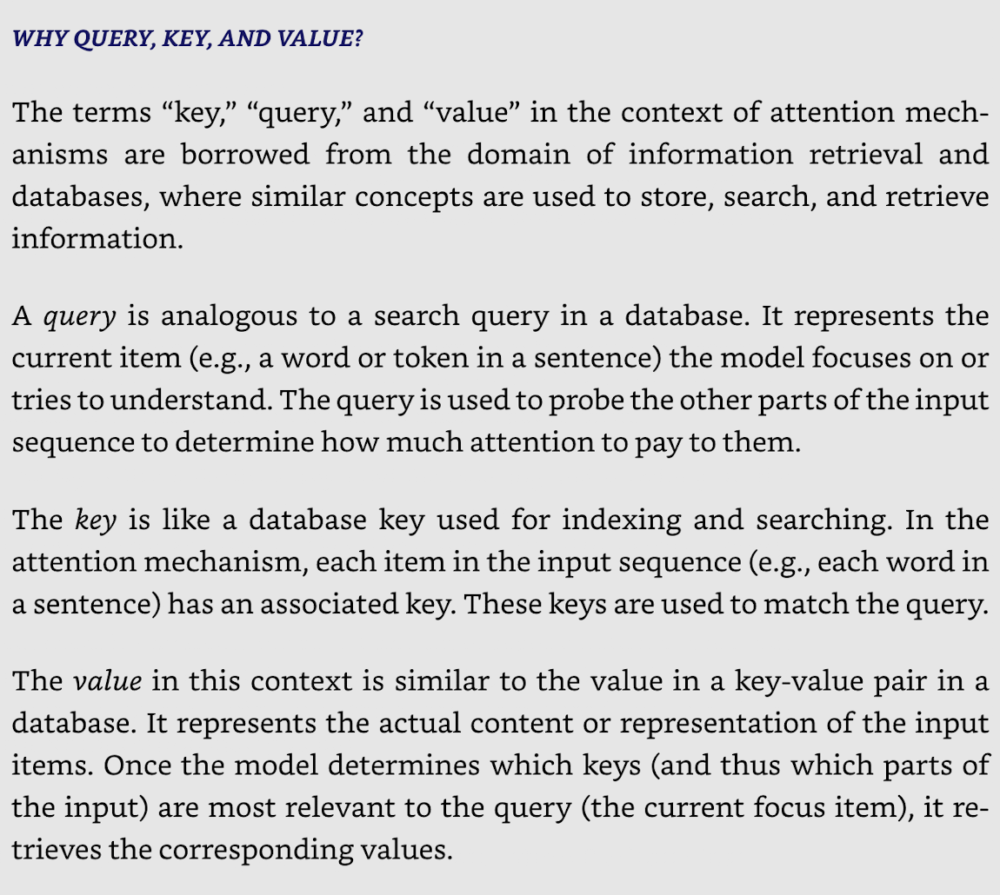

### 3.4.2 Implementing the compact self-attention Python class

In [47]:
import torch.nn as nn
class SelfAttention_v1(nn.Module):
    def __init__(self,d_in,d_out):
        super().__init__()
        self.W_query = nn.Parameter(torch.rand(d_in,d_out)) # initializing the weights to transform input
        self.W_key = nn.Parameter(torch.rand(d_in,d_out))
        self.W_values = nn.Parameter(torch.rand(d_in,d_out))

    def forward(self,x):
        keys = x @ self.W_key
        quaries = x @ self.W_query
        values = x @ self.W_values # transforming input with the help of random nn weights 
        attn_scores = quaries @ keys.T # omega = attention scores calculated as the dot product between quaeries and keys

        attn_weights = torch.softmax( attn_scores/ keys.shape[-1]**0.5 , dim=-1) # scaled the attention scores by dimention of the keys i.e. embedding dimention ( as this could cause 0 gradient after softmax normalization)

        context_vec = attn_weights @ values # transforming the input with the help of attention weights

        return context_vec
    

- nn.Modules is the fundamental building block of Pytorch Models help us to neccessary model functionalities like layer creation and management.
- The `__init__` method intialize the trainable weigths which tranform the input dimentions from  `d_in` to `d_out`
- We can use the above class as follows:


In [48]:
torch.manual_seed(123)
sa_v1 = SelfAttention_v1(d_in,d_out)
print(sa_v1(inputs))

tensor([[0.2977, 0.7965],
        [0.3043, 0.8124],
        [0.3039, 0.8116],
        [0.2930, 0.7850],
        [0.2909, 0.7803],
        [0.2960, 0.7923]], grad_fn=<MmBackward0>)


- Since input has 6 embedding vectors, the resulting matrci will have 6 context vectors.
  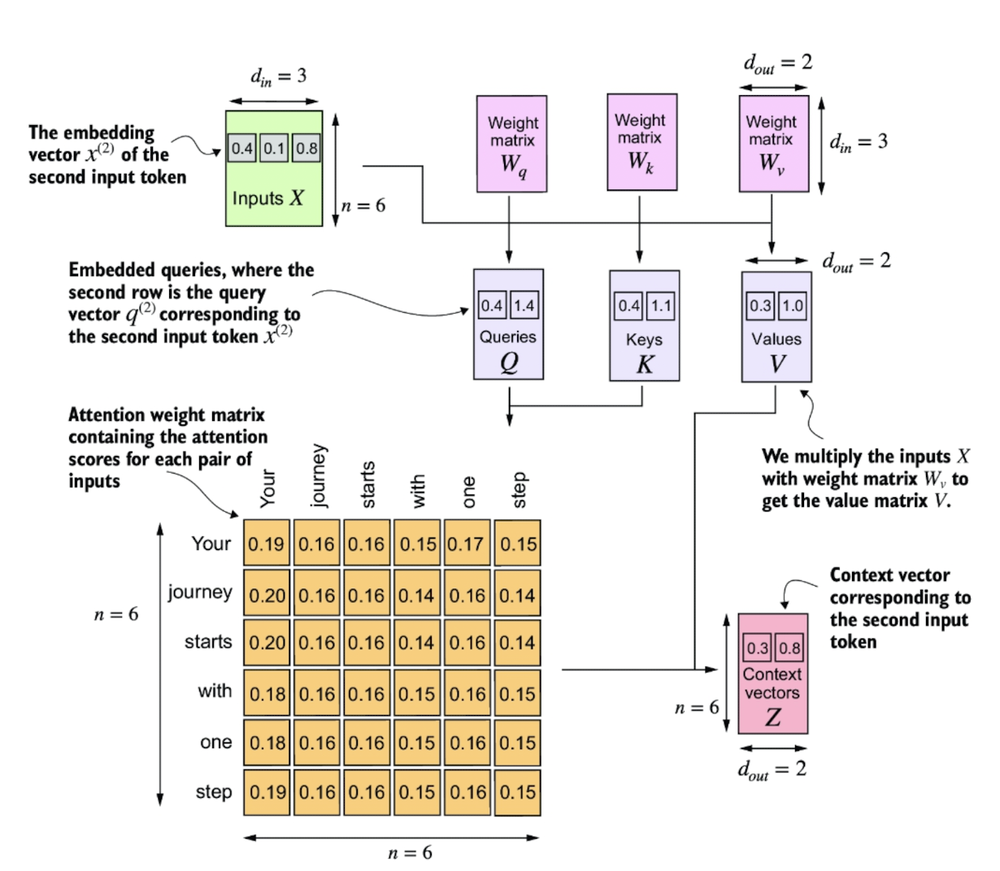

- Transformorming the input vector embedding using the trainable weights are crusial step for the self attention mechanism.
- As the model is exposed to the more data during training, it adjusts these trainable weights.
- We can further improve the `SelfAttentiion_v1` by utilizing the `nn.Linear` layers, which effectively performs the matrix multiplication as the bias is disabled.
- Also `nn.Linear` has optimized weight initialization contributing to more stable and effective training compared to `nn.Parameter(nn.rand(..))`.

#### Self attention using the Pytorch Linear layer

In [49]:
import torch.nn as nn
class SelfAttention_v2(nn.Module):
    def __init__(self,d_in,d_out, qkv_bias = False):
        super().__init__()
        self.W_query = nn.Linear(d_in, d_out, bias=qkv_bias) # initializing the weights to transform input
        self.W_key = nn.Linear(d_in, d_out, bias=qkv_bias)
        self.W_values = nn.Linear(d_in, d_out, bias=qkv_bias)

    def forward(self,x):
        keys = self.W_key(x)
        quaries = self.W_query(x)
        values = self.W_values(x) # transforming input with the help of Linear nn weights (nn.Linear performs the matrices multiplication with bias = False)
        attn_scores = quaries @ keys.T # omega = attention scores calculated as the dot product between quaeries and keys

        attn_weights = torch.softmax( attn_scores/ keys.shape[-1]**0.5 , dim=-1) # scaled the attention scores by dimention of the keys i.e. embedding dimention ( as this could cause 0 gradient after softmax normalization)

        context_vec = attn_weights @ values # transforming the input with the help of attention weights

        return context_vec

In [50]:
torch.manual_seed(789)
sa_v2 = SelfAttention_v2(d_in,d_out)
print(sa_v2(inputs))

tensor([[-0.0740,  0.0695],
        [-0.0747,  0.0689],
        [-0.0748,  0.0688],
        [-0.0761,  0.0665],
        [-0.0765,  0.0659],
        [-0.0757,  0.0672]], grad_fn=<MmBackward0>)


---

##### Exercise 3.1: Compare the SelfAttention_v1 and SelfAttention_v2, also pass the weights of the SelfAttention_v2 to the SelfAttention_v1 instance
Hint:nn.Linear store the weight matrix in Transposed form

In [51]:
import torch
inputs = torch.tensor(
    [[0.43,0.15,0.89], # Your (x^1)
     [0.55,0.87,0.66], # journey  (x^2)
     [0.57,0.85,0.64], # start  (x^3)
     [0.22,0.58,0.33], # with (x^4)
     [0.77,0.25, 0.10], # one (x^5)
     [0.0,0.8,0.5] # step (x^6)
    ]
)
d_in,d_out = 3, 2

In [52]:
import torch.nn as nn
class SelfAttention_v1(nn.Module):
    def __init__(self,d_in,d_out):
        super().__init__()
        self.W_query = nn.Parameter(torch.rand(d_in,d_out)) # initializing the weights to transform input
        self.W_key = nn.Parameter(torch.rand(d_in,d_out))
        self.W_value = nn.Parameter(torch.rand(d_in,d_out))

    def forward(self,x):
        keys = x @ self.W_key
        quaries = x @ self.W_query
        values = x @ self.W_value # transforming input with the help of random nn weights 
        attn_scores = quaries @ keys.T # omega = attention scores calculated as the dot product between quaeries and keys

        attn_weights = torch.softmax( attn_scores/ keys.shape[-1]**0.5 , dim=-1) # scaled the attention scores by dimention of the keys i.e. embedding dimention ( as this could cause 0 gradient after softmax normalization)

        context_vec = attn_weights @ values # transforming the input with the help of attention weights

        return context_vec

torch.manual_seed(123)
sa_v1 = SelfAttention_v1(d_in,d_out)

In [53]:
import torch.nn as nn
class SelfAttention_v2(nn.Module):
    def __init__(self,d_in,d_out, qkv_bias = False):
        super().__init__()
        self.W_query = nn.Linear(d_in, d_out, bias=qkv_bias) # initializing the weights to transform input
        self.W_key = nn.Linear(d_in, d_out, bias=qkv_bias)
        self.W_value = nn.Linear(d_in, d_out, bias=qkv_bias)

    def forward(self,x):
        keys = self.W_key(x)
        quaries = self.W_query(x)
        values = self.W_value(x) # transforming input with the help of Linear nn weights (nn.Linear performs the matrices multiplication with bias = False)
        attn_scores = quaries @ keys.T # omega = attention scores calculated as the dot product between quaeries and keys

        attn_weights = torch.softmax( attn_scores/ keys.shape[-1]**0.5 , dim=-1) # scaled the attention scores by dimention of the keys i.e. embedding dimention ( as this could cause 0 gradient after softmax normalization)

        context_vec = attn_weights @ values # transforming the input with the help of attention weights

        return context_vec
torch.manual_seed(123)
sa_v2 = SelfAttention_v2(d_in,d_out)

In [54]:
sa_v1.W_query = torch.nn.Parameter(sa_v2.W_query.weight.T)
sa_v1.W_key = torch.nn.Parameter(sa_v2.W_key.weight.T)
sa_v1.W_value = torch.nn.Parameter(sa_v2.W_value.weight.T)

In [55]:
sa_v1(inputs)

tensor([[-0.5286, -0.1070],
        [-0.5267, -0.1101],
        [-0.5267, -0.1100],
        [-0.5239, -0.1098],
        [-0.5255, -0.1087],
        [-0.5235, -0.1104]], grad_fn=<MmBackward0>)

In [56]:
sa_v2(inputs)

tensor([[-0.5286, -0.1070],
        [-0.5267, -0.1101],
        [-0.5267, -0.1100],
        [-0.5239, -0.1098],
        [-0.5255, -0.1087],
        [-0.5235, -0.1104]], grad_fn=<MmBackward0>)

---

- Now we will make enhancements in the self-attention mechanism, focusing on the casual aspect and multi-head attention.
- The casual aspect prevent the model to access the future information in the sequence, which is important in the language modeling as each word prediction should only depends on the previous tokens only.
- The multiple head component, inolves the spliting the attention into multiple heads.
- Each head learns different aspect of the data. Allowing the model to attend the different information from different representation subspaces at different possitions.This improves the performance for complex tasks.

### 3.5 Hiding the Future word with Causal Attention
- We need only previous tokens for predicting the next tokens. Casual attention also called as `masked attention` is a specialized form of self attention.
  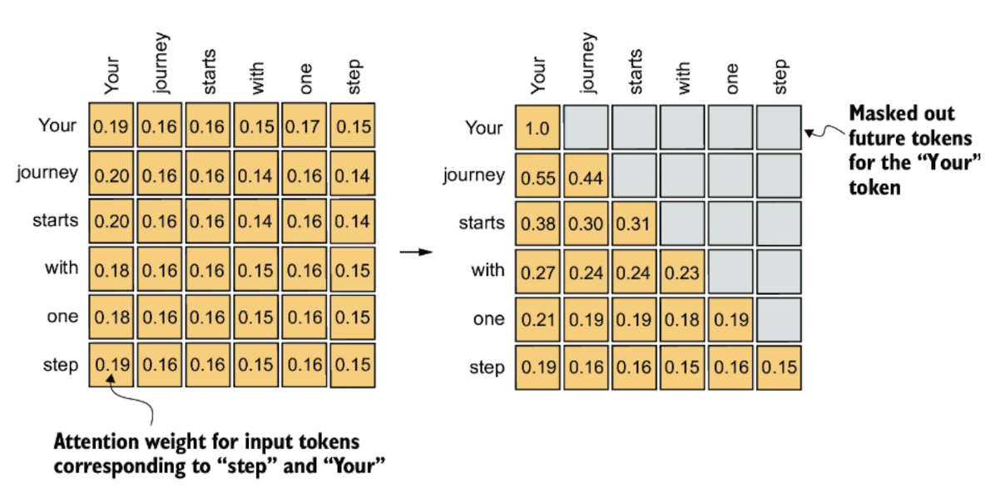

#### 3.5.1 Applying the causal Attention mask
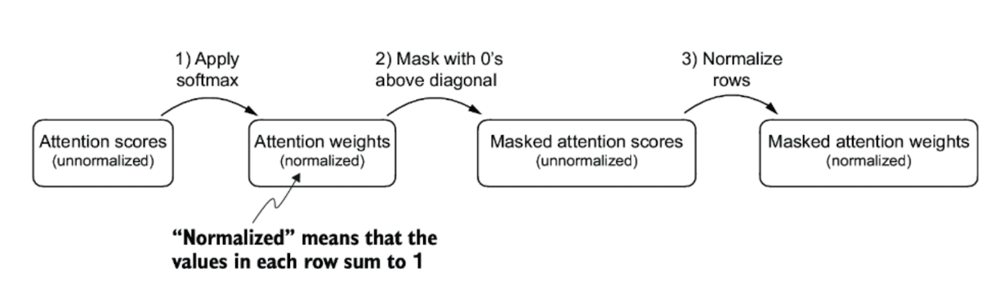

In [57]:
quaries = sa_v2.W_query(inputs) # reusing the weight matrix from v2  (input = 6*3 , (d_in =3,d_out =2) = (6*2)
keys = sa_v2.W_key(inputs)
attn_scores = quaries @ keys.T # (6*2) x (2*6) = (6*6)
attn_weights = torch.softmax(attn_scores/ keys.shape[-1]**0.5 , dim=-1)
print(attn_weights)

tensor([[0.1721, 0.1766, 0.1765, 0.1559, 0.1631, 0.1557],
        [0.1638, 0.1752, 0.1748, 0.1614, 0.1607, 0.1641],
        [0.1639, 0.1751, 0.1748, 0.1614, 0.1608, 0.1640],
        [0.1637, 0.1704, 0.1702, 0.1652, 0.1633, 0.1671],
        [0.1669, 0.1724, 0.1723, 0.1619, 0.1635, 0.1629],
        [0.1620, 0.1702, 0.1699, 0.1663, 0.1627, 0.1688]],
       grad_fn=<SoftmaxBackward0>)


- We can use the Pytorch's `tril` function to create the zero's above the diagonal matrix.
  

In [58]:
quaries.shape[0]

6

In [59]:
attn_scores.shape[0]

6

In [60]:
context_length = attn_scores.shape[0]
mask_simple = torch.tril(torch.ones(context_length,context_length))
print(mask_simple)

tensor([[1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0.],
        [1., 1., 1., 0., 0., 0.],
        [1., 1., 1., 1., 0., 0.],
        [1., 1., 1., 1., 1., 0.],
        [1., 1., 1., 1., 1., 1.]])


In [61]:
# we can multiply the attention weights now then above diagonal weights will be zero
masked_simple = attn_weights * mask_simple
print(masked_simple)

tensor([[0.1721, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.1638, 0.1752, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.1639, 0.1751, 0.1748, 0.0000, 0.0000, 0.0000],
        [0.1637, 0.1704, 0.1702, 0.1652, 0.0000, 0.0000],
        [0.1669, 0.1724, 0.1723, 0.1619, 0.1635, 0.0000],
        [0.1620, 0.1702, 0.1699, 0.1663, 0.1627, 0.1688]],
       grad_fn=<MulBackward0>)


- Next step is to renormalise the attention weights to sum =1.
- We can achieve by deviding by the Sum of each row


In [62]:
row_sum = masked_simple.sum(dim=-1)
print(row_sum)

tensor([0.1721, 0.3390, 0.5139, 0.6696, 0.8371, 1.0000],
       grad_fn=<SumBackward1>)


In [63]:
row_sum = masked_simple.sum(dim=-1, keepdim= True)
print(row_sum)

tensor([[0.1721],
        [0.3390],
        [0.5139],
        [0.6696],
        [0.8371],
        [1.0000]], grad_fn=<SumBackward1>)


In [64]:
row_sum = masked_simple.sum(dim=-1, keepdim= True)
masked_simple_norm = masked_simple/row_sum
print(masked_simple_norm)

tensor([[1.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.4833, 0.5167, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.3190, 0.3408, 0.3402, 0.0000, 0.0000, 0.0000],
        [0.2445, 0.2545, 0.2542, 0.2468, 0.0000, 0.0000],
        [0.1994, 0.2060, 0.2058, 0.1935, 0.1953, 0.0000],
        [0.1620, 0.1702, 0.1699, 0.1663, 0.1627, 0.1688]],
       grad_fn=<DivBackward0>)


##### Information Leakage
- The mathematical elegance of softmax is that despite initially including all possitions in the denominator, after masking and renormalization. The effect of masked possition is nullified - they don't contribute in any meaningful way.
  - We could improve the casual attention implementation using the softmax
 
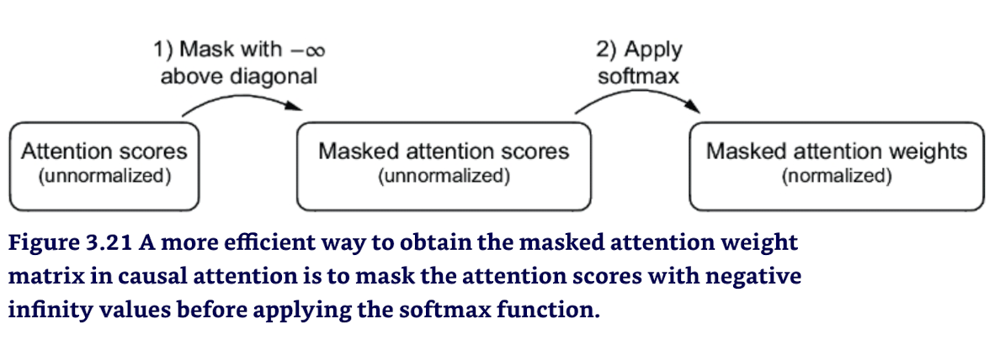
- if we make diagonal matrix $-\infty$ then softmax make it zero probability as $e^{-\infty}$ probability approaches to the 0
- More efficient way to implement is that first we will make 1's above diagonal elements and replace them with `-inf`

In [65]:
mask = torch.triu(torch.ones(context_length,context_length), diagonal=1)
print(mask)

tensor([[0., 1., 1., 1., 1., 1.],
        [0., 0., 1., 1., 1., 1.],
        [0., 0., 0., 1., 1., 1.],
        [0., 0., 0., 0., 1., 1.],
        [0., 0., 0., 0., 0., 1.],
        [0., 0., 0., 0., 0., 0.]])


In [66]:
attn_scores

tensor([[0.3111, 0.3479, 0.3471, 0.1714, 0.2350, 0.1695],
        [0.1655, 0.2602, 0.2576, 0.1445, 0.1384, 0.1679],
        [0.1667, 0.2602, 0.2577, 0.1443, 0.1391, 0.1671],
        [0.0510, 0.1080, 0.1064, 0.0643, 0.0476, 0.0805],
        [0.1415, 0.1875, 0.1863, 0.0987, 0.1121, 0.1073],
        [0.0239, 0.0932, 0.0912, 0.0604, 0.0299, 0.0818]],
       grad_fn=<MmBackward0>)

In [67]:
attn_weights

tensor([[0.1721, 0.1766, 0.1765, 0.1559, 0.1631, 0.1557],
        [0.1638, 0.1752, 0.1748, 0.1614, 0.1607, 0.1641],
        [0.1639, 0.1751, 0.1748, 0.1614, 0.1608, 0.1640],
        [0.1637, 0.1704, 0.1702, 0.1652, 0.1633, 0.1671],
        [0.1669, 0.1724, 0.1723, 0.1619, 0.1635, 0.1629],
        [0.1620, 0.1702, 0.1699, 0.1663, 0.1627, 0.1688]],
       grad_fn=<SoftmaxBackward0>)

In [68]:
masked = attn_scores.masked_fill(mask.bool(),-torch.inf)
print(masked)

tensor([[0.3111,   -inf,   -inf,   -inf,   -inf,   -inf],
        [0.1655, 0.2602,   -inf,   -inf,   -inf,   -inf],
        [0.1667, 0.2602, 0.2577,   -inf,   -inf,   -inf],
        [0.0510, 0.1080, 0.1064, 0.0643,   -inf,   -inf],
        [0.1415, 0.1875, 0.1863, 0.0987, 0.1121,   -inf],
        [0.0239, 0.0932, 0.0912, 0.0604, 0.0299, 0.0818]],
       grad_fn=<MaskedFillBackward0>)


In [69]:
attn_weights = torch.softmax(masked/keys.shape[-1]**0.5 , dim=1)
print(attn_weights)

tensor([[1.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.4833, 0.5167, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.3190, 0.3408, 0.3402, 0.0000, 0.0000, 0.0000],
        [0.2445, 0.2545, 0.2542, 0.2468, 0.0000, 0.0000],
        [0.1994, 0.2060, 0.2058, 0.1935, 0.1953, 0.0000],
        [0.1620, 0.1702, 0.1699, 0.1663, 0.1627, 0.1688]],
       grad_fn=<SoftmaxBackward0>)


- we can apply the casual attention as `attn_weights * values` but we will cover first a minor tweak in the casual attention

#### 3.5.2 Masking additional weights with dropout
- this steps helps the model to avoid the overfitting.
- It is important to note that dropout is used only during the training and is disabled afterwards.
- In transformer dropout is usually applied 2 times , also similar architecture like GPT also.
- After calculating the attention weights or after applying the attention weights to the value vector.
-  Here, we will apply after computing the attention weights.As this variant is very common in practice.
   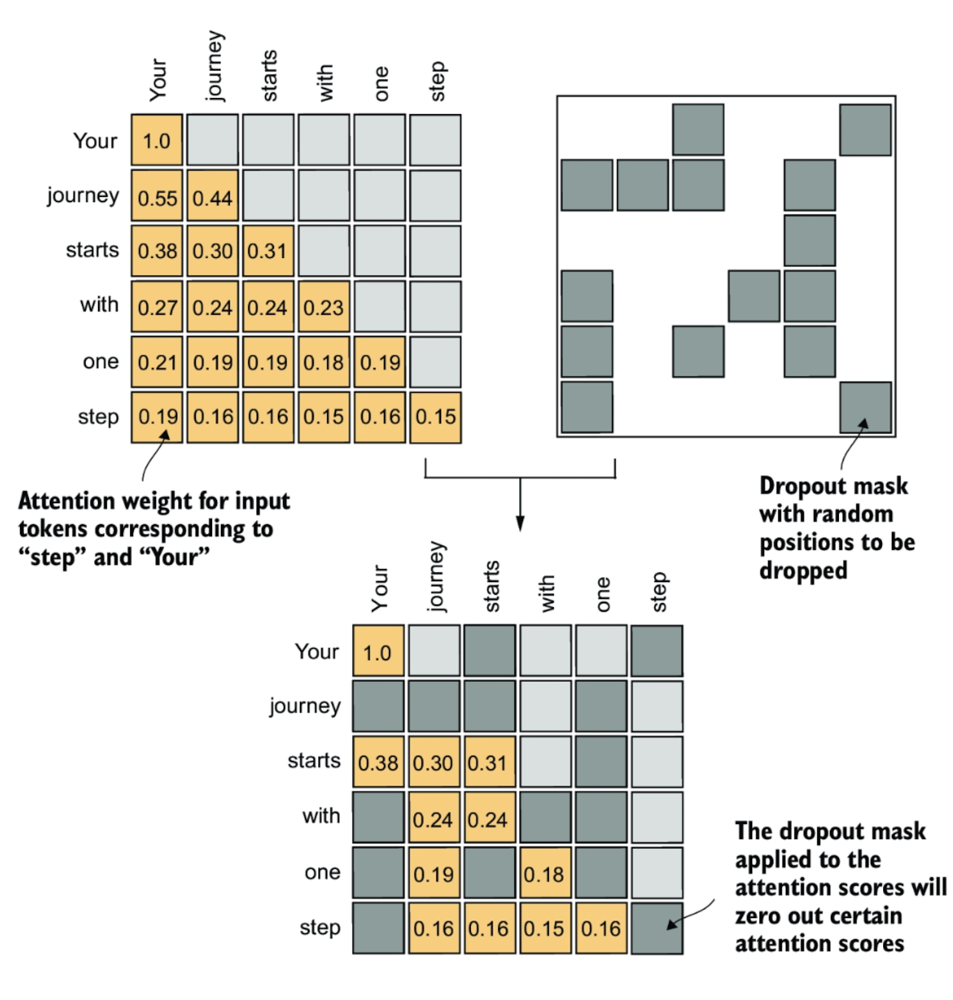

- Here we will implement dropout with 50%, but later will do it as 0.1 or 0.2 while in the GPT later

In [70]:
torch.manual_seed(123)
dropout = torch.nn.Dropout(0.5) # dropout rate as 50%
example = torch.ones(6,6)
print(dropout(example))

tensor([[2., 2., 0., 2., 2., 0.],
        [0., 0., 0., 2., 0., 2.],
        [2., 2., 2., 2., 0., 2.],
        [0., 2., 2., 0., 0., 2.],
        [0., 2., 0., 2., 0., 2.],
        [0., 2., 2., 2., 2., 0.]])


Note to compentiate for the reduction in active element in the attention weights, the value of the remainng elements are scaled up be 1/0.5 = 2. This scaling is important to keep the overall balance of the attention weights. ensuring the average influence of the attention mechanism remains consistent during bith training and inferencing time.

In [71]:
torch.manual_seed(123)
print(dropout(attn_weights))

tensor([[2.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.6380, 0.6816, 0.6804, 0.0000, 0.0000, 0.0000],
        [0.0000, 0.5090, 0.5085, 0.0000, 0.0000, 0.0000],
        [0.0000, 0.4120, 0.0000, 0.3869, 0.0000, 0.0000],
        [0.0000, 0.3404, 0.3399, 0.3326, 0.3255, 0.0000]],
       grad_fn=<MulBackward0>)


#### 3.5.3 Implementing the compact causal attention class

- We have to make sure also that our casual attention handles from the batches also
- So we will increase the data for making batches

In [72]:
batch = torch.stack((inputs,inputs), dim=0)
print(batch) # Two inputs with 6 tokens each, each token has 3 embedding dimension.

tensor([[[0.4300, 0.1500, 0.8900],
         [0.5500, 0.8700, 0.6600],
         [0.5700, 0.8500, 0.6400],
         [0.2200, 0.5800, 0.3300],
         [0.7700, 0.2500, 0.1000],
         [0.0000, 0.8000, 0.5000]],

        [[0.4300, 0.1500, 0.8900],
         [0.5500, 0.8700, 0.6600],
         [0.5700, 0.8500, 0.6400],
         [0.2200, 0.5800, 0.3300],
         [0.7700, 0.2500, 0.1000],
         [0.0000, 0.8000, 0.5000]]])


In [73]:
print(batch.shape)

torch.Size([2, 6, 3])


In [74]:
# A compact causal attention class
import torch
class CausalAttention(nn.Module):
    def __init__(self,d_in, d_out, context_length, dropout, qkv_bias = False):
        super().__init__()
        self.d_out = d_out
        self.W_query = torch.nn.Linear(d_in,d_out,bias =qkv_bias)
        self.W_key = torch.nn.Linear(d_in,d_out,bias =qkv_bias)
        self.W_value = torch.nn.Linear(d_in,d_out,bias =qkv_bias)
        self.dropout = torch.nn.Dropout(dropout)
        self.register_buffer(
            'mask',
            torch.triu(torch.ones(context_length, context_length), diagonal=1)
        ) # this will automatically switch devices (GPU or CPU) for that tensor stay on one devices avoid machine mismatch error

    def forward(self, x):
        b, num_tokens, d_in = x.shape # we transpose dimension 1 and 2, keeping the 
        queries = self.W_query(x)
        keys = self.W_key(x)
        values = self.W_value(x)

        attn_scores = queries @ keys.transpose(1,2)
        attn_scores.masked_fill_(                    # in pytorch, operation trailing underscores are performed in_place, avoiding unnecessary memory copies. 
        self.mask.bool()[:num_tokens, :num_tokens], -torch.inf)

        attn_weights = torch.softmax( attn_scores/ keys.shape[-1]**0.5 , dim=-1)

        attn_weights =self.dropout(attn_weights)

        context_vec = attn_weights @ values

        return context_vec

`Self.register_buffer` usem is not neccessary but have several advantages. buffer automatically move the devices (GPU or CPU), which is relevant when training the LLM. 
- Which means we don't have to manually sure that tensors are on same device as your model, avoiding device mismatch error.

In [75]:
torch.manual_seed(123)
context_length = batch.shape[1] # [2,6,3] = 6
ca = CausalAttention(d_in,d_out,context_length,0.0) # no dropout
context_vec = ca(batch)
print("context vec shapes:", context_vec.shape)

context vec shapes: torch.Size([2, 6, 2])


In [76]:
context_vec

tensor([[[-0.4519,  0.2216],
         [-0.5874,  0.0058],
         [-0.6300, -0.0632],
         [-0.5675, -0.0843],
         [-0.5526, -0.0981],
         [-0.5235, -0.1104]],

        [[-0.4519,  0.2216],
         [-0.5874,  0.0058],
         [-0.6300, -0.0632],
         [-0.5675, -0.0843],
         [-0.5526, -0.0981],
         [-0.5235, -0.1104]]], grad_fn=<UnsafeViewBackward0>)

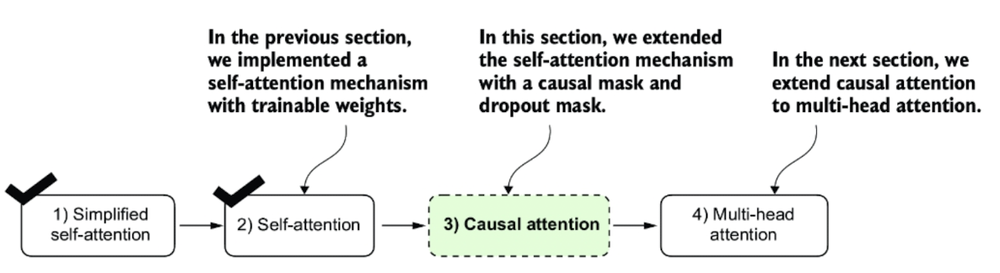

### 3.6 Extending the single head attention to multi-head attention

- Our aim is to transfer previously implemented single head causal attention to multiple heads --> multi-head attention.

#### 3.6.1 Stacking multiple single-head attention layer
- Implementing the multi-head attention involves creating the multiple instances of self attention, each with individual weights, and then combining their outputs.
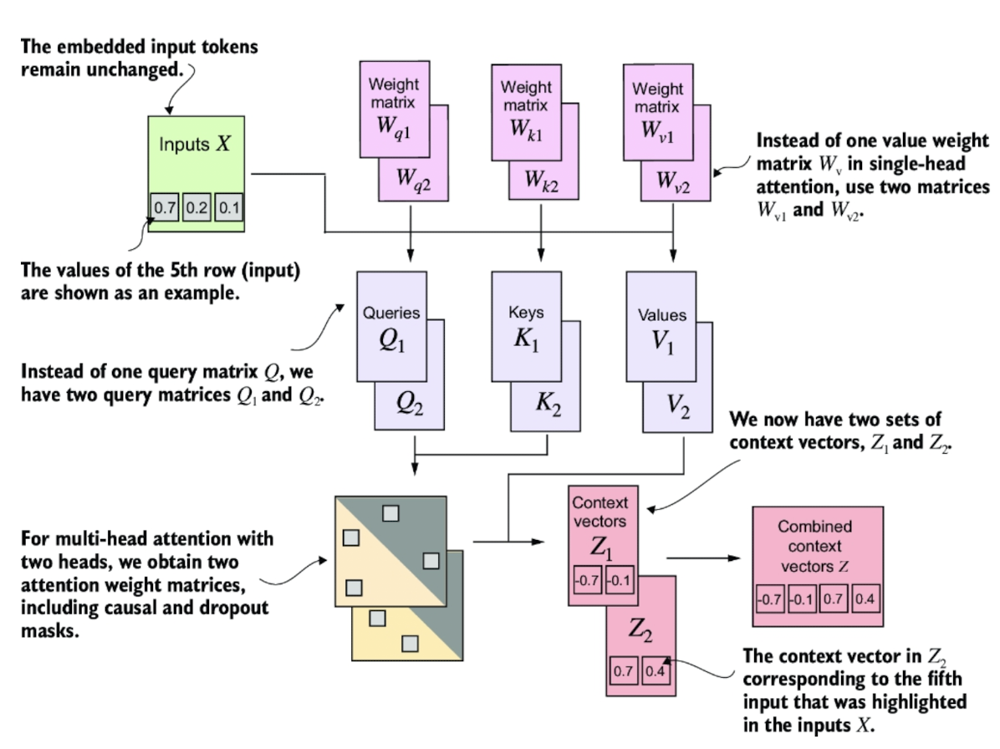

- Using the multiple instances of self attention mechanism is computationally expensive, but it's crucial for the kind of the complex pattern regognision.
- The main idea of the multiple head attention is to run the multiple attentions in parallel, with learned linear projections,the results of multiplying the input data with weight matrices (Key,query and value).
- We will implement first simple multi-head attention class. 

In [77]:
# A wrapper class to implement the multi-head attention.
class MultiHeadAttentionWrapper(nn.Module):
    
    def __init__(self, d_in, d_out,context_length,
                 dropout, num_heads, qkv_bais=False):
        super().__init__()
        self.heads = nn.ModuleList([CausalAttention(d_in, d_out, context_length, dropout, qkv_bais) for _ in range(num_heads)])

    def forward(self,x):
        return torch.cat([ head(x) for head in self.heads], dim= -1)
    

- Example if we have num_heads =2 , d_out=2 then we will have 4 dimentionals context vector = d_out * num_heads = 2*2 =4
  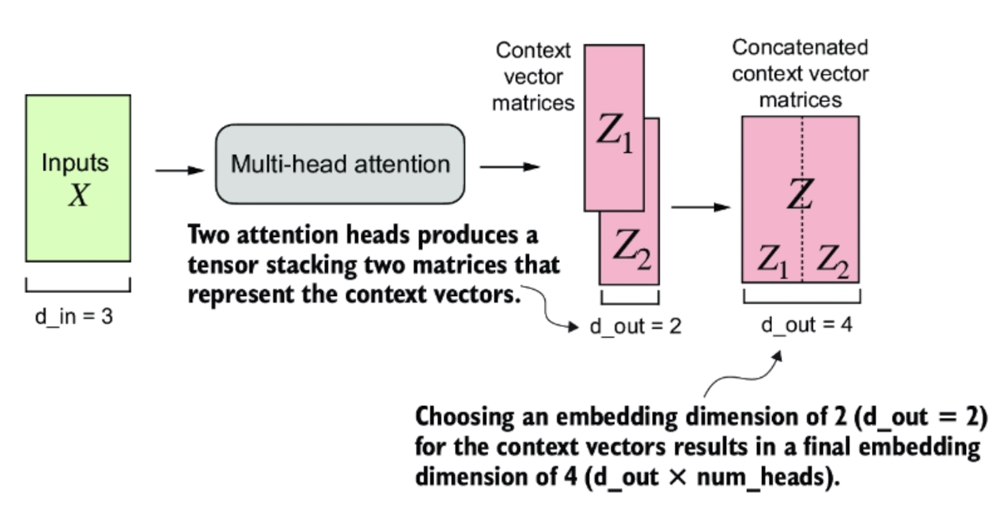

In [78]:
torch.manual_seed(123)
context_length = batch.shape[1] # this is the num tokens
d_in, d_out = 3, 2
mha = MultiHeadAttentionWrapper(
    d_in, d_out, context_length, 0.0, num_heads= 2
)

context_vec = mha(batch)
print(context_vec)
print("Context vec shape is:",context_vec.shape)

tensor([[[-0.4519,  0.2216,  0.4772,  0.1063],
         [-0.5874,  0.0058,  0.5891,  0.3257],
         [-0.6300, -0.0632,  0.6202,  0.3860],
         [-0.5675, -0.0843,  0.5478,  0.3589],
         [-0.5526, -0.0981,  0.5321,  0.3428],
         [-0.5235, -0.1104,  0.5010,  0.3475]],

        [[-0.4519,  0.2216,  0.4772,  0.1063],
         [-0.5874,  0.0058,  0.5891,  0.3257],
         [-0.6300, -0.0632,  0.6202,  0.3860],
         [-0.5675, -0.0843,  0.5478,  0.3589],
         [-0.5526, -0.0981,  0.5321,  0.3428],
         [-0.5235, -0.1104,  0.5010,  0.3475]]], grad_fn=<CatBackward0>)
Context vec shape is: torch.Size([2, 6, 4])


- In above 2nd batch has same context vector as we took 2nd batch same inputs.

---

##### Exercise 3.2 Returning 2 dimentional embedding vectors--> output should be 2 dimensions context vector change the input arguments


In [79]:
torch.manual_seed(123)
context_length = batch.shape[1] # this is the num tokens
d_in, d_out = 3, 1
mha = MultiHeadAttentionWrapper(
    d_in, d_out, context_length, 0.0, num_heads= 2
)

context_vec = mha(batch)
print(context_vec)
print("Context vec shape is:",context_vec.shape)

tensor([[[-0.5740,  0.2216],
         [-0.7320,  0.0155],
         [-0.7774, -0.0546],
         [-0.6979, -0.0817],
         [-0.6538, -0.0957],
         [-0.6355, -0.1088]],

        [[-0.5740,  0.2216],
         [-0.7320,  0.0155],
         [-0.7774, -0.0546],
         [-0.6979, -0.0817],
         [-0.6538, -0.0957],
         [-0.6355, -0.1088]]], grad_fn=<CatBackward0>)
Context vec shape is: torch.Size([2, 6, 2])


---

- Now we have implemented the attention heads sequentially `[ head(x) for head in self.heads]`, for better implementation we can process them parallely.
- one way to achieve this is to compute the attention heads by matrix multiplication simultaneously. 

### 3.6.2 Implementing the multi-head attention with weight split

In [80]:
# 3.5 An efficient multi-head attention class
class MultiHeadAttention(nn.Module):
    def __init__(self, d_in, d_out,
                 context_length, dropout, num_heads, qkv_bias = False):
        super().__init__()
        assert(d_out % num_heads ==0), \
        "embedded_ dim must be divisible by num_heads"

        self.d_out = d_out
        self.num_heads = num_heads
        self.head_dim = d_out // num_heads      #1 . Reduce the projection dimension to match the desired output dim
        self.W_query = nn.Linear(d_in, d_out, bias = qkv_bias)
        self.W_key = nn.Linear(d_in, d_out, bias = qkv_bias)
        self.W_value = nn.Linear(d_in, d_out, bias = qkv_bias)
        self.out_proj = nn.Linear(d_out, d_out)     #2. Uses the linear layer to combine the heads outputs
        self.dropout = nn.Dropout(dropout)
        self.register_buffer(
            "mask",
            torch.triu(torch.ones(context_length,context_length), diagonal = 1)
        )

    def forward(self,x):
        b, num_tokens, d_in = x.shape
        keys = self.W_key(x) # 3. tensor shape [b,num_token, d_out)
        quaries = self.W_query(x)
        values = self.W_value(x)

        keys =keys.view(b, num_tokens, self.num_heads, self.head_dim) # 4. We implicitly split the matrix by adding the 
        # num_head dimention. Then we unroll the last dimention (b, num_token, d_out) & (b, num_tokens, num_heads, head_dim)
        quaries = quaries.view(b, num_tokens, self.num_heads, self.head_dim)
        values = values.view(b, num_tokens, self.num_heads, self.head_dim)

        keys = keys.transpose(1,2) # 5. Transpose from shape (b, num_tokens, num_heads, head_dim ) to (b,num_heads, num_tokens, head_dim)
        queries = quaries.transpose(1,2)
        values = values.transpose(1,2)
        attn_scores =  queries @ keys.transpose(2,3) # 6. Computes dot product for each heads.
        mask_bool = self.mask.bool()[:num_tokens, :num_tokens] #7. mask truncated the number of tokens
        attn_scores.masked_fill_(mask_bool, -torch.inf)  #8. uses mask to fill attention

        attn_weights = torch.softmax( attn_scores/ keys.shape[-1]**0.5, dim = -1)

        attn_weights = self.dropout(attn_weights)

        context_vec = (attn_weights @ values).transpose(1,2) # shape = (b, num_tokens, num_heads, heads_dim)

        context_vec = context_vec.contiguous().view(b, num_tokens, self.d_out) # Combine heads where _out = self.num_heads * head_dim

        context_vec = self.out_proj(context_vec) # add an optional linear projection 

        return context_vec
        

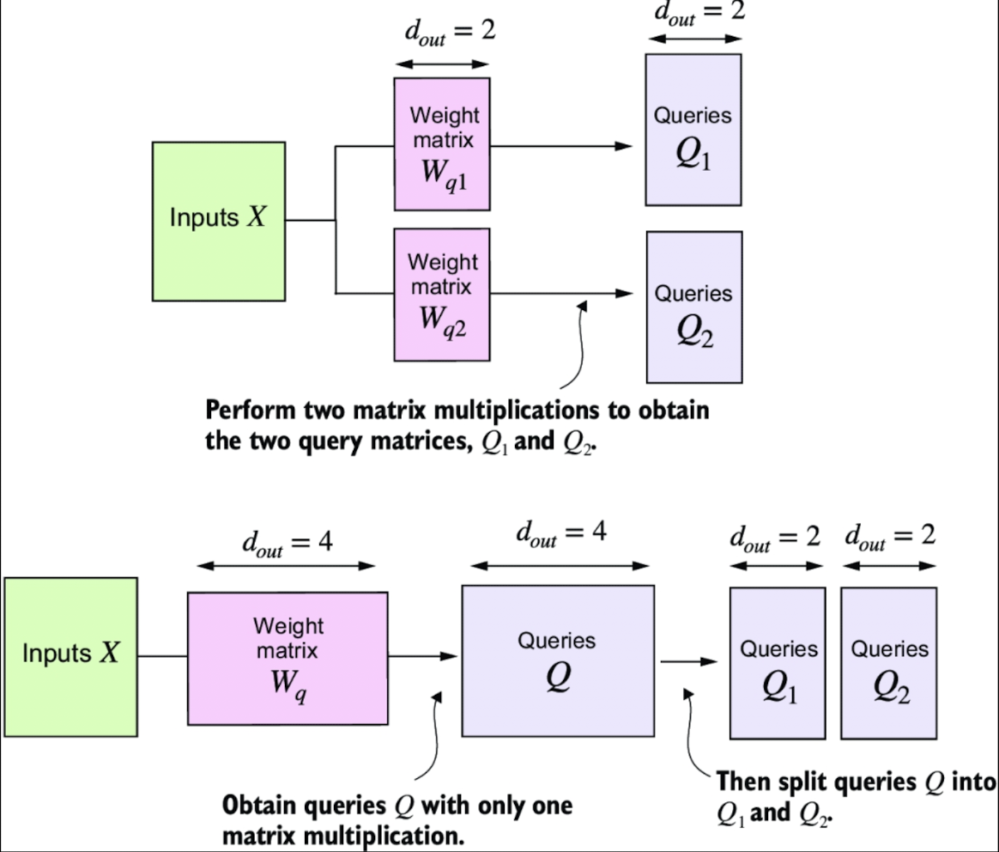

- Above picture top we did in MultiHeadAttentionWrapper class and
- We are doing now we are making one big weight matrix and then finding query and then split. similar for keys and values
- Spliting is acheived through `.view` and `.transpose`
- The key operation is to split the `d_out` dimension into `num_heads` and `head_dim`, where <span style="color:red;"> head_dim = d_out/num_heads </span>
- This spliting is achieved by `.view` method, a tensor of dimension (b, num_tokens, d_out) is reshaped into (b, num_tokens, num_heads, head_dim).
- The tensor are then transposed to bring the `num_heads` dimensions before `num_tokens` dimensions resulting in the shape `(b, num_heads, num_tokens, head_dim)`. This transposition is crucial for correctly alligning query, key and value across different heads and perform batched matrix multiplication.
Lets see it:

In [81]:
# (b, num_heads, num_tokens, head_dim) = (1, 2, 3, 4)
a = torch.tensor([[[[0.2745, 0.6584, 0.2775, 0.8573],
                    [0.8993, 0.0390, 0.9268, 0.7388],
                    [0.7179, 0.7058, 0.9156, 0.4340]],

                   [[0.0772, 0.3565, 0.1479, 0.5331],
                    [0.4066, 0.2318, 0.4545, 0.9737],
                    [0.4606, 0.5159, 0.4220, 0.5786]]]])


In [82]:
a.shape

torch.Size([1, 2, 3, 4])

In [83]:
a.transpose(2,3).shape # (b,num_heads, head_dim, num_tokens)

torch.Size([1, 2, 4, 3])

- Now we will perform batched matrix multiplication between tensor itself and view of the tensor where we transposed last two dimensions, num_tokens and head_dim

In [84]:
print(a @ a.transpose(2,3)) # pytorch handles the 4 dim matrix multiplication and multiplication 
#happens between last two dim (num_tokens,num_heads)

tensor([[[[1.3208, 1.1631, 1.2879],
          [1.1631, 2.2150, 1.8424],
          [1.2879, 1.8424, 2.0402]],

         [[0.4391, 0.7003, 0.5903],
          [0.7003, 1.3737, 1.0620],
          [0.5903, 1.0620, 0.9912]]]])


In [85]:
# For instance, the preceding becomes more compact way to compute matrix multiplication for each head seprately.
first_head = a[0,0, :,:]
first_res = first_head @ first_head.T
print("First head result:\n", first_res)

First head result:
 tensor([[1.3208, 1.1631, 1.2879],
        [1.1631, 2.2150, 1.8424],
        [1.2879, 1.8424, 2.0402]])


In [86]:
second_head = a[0,1,:,:]
second_res = second_head @ second_head.T
print("Second head result:\n", second_res)

Second head result:
 tensor([[0.4391, 0.7003, 0.5903],
        [0.7003, 1.3737, 1.0620],
        [0.5903, 1.0620, 0.9912]])


The results are exactly as when we did `a @ a.transpose(2,3)`

- After computing the attention weights and context vector, the context vector from all heads are transposed back to the shape `(b, num_token, num_heads, head_dim)`.
- These vectors are then flattend or reshaped into `(b, num_tokens, d_out)` effectively combining the outputs from all heads.

- Additionally we added the output projection layer `(self.out_proj)` to *MultiHeadAttention* after combining the heads which is not present in the CausalAttention class. The projection layer is not strictly neccessary (See Appendix B). but commonly used in most LLMs.
- The MultiheadAttention class is efficient implementation for matrix multiplication otherwise both MultiheadAttention and MultiheadAttetionWrapper class have same concept. As matrix multiplication is one of most computationally expensive step in self-attention

In [87]:
batch.shape

torch.Size([2, 6, 3])

In [88]:
torch.manual_seed(123)
batch_size, context_length, d_in = batch.shape
d_out = 2
mha = MultiHeadAttention(d_in, d_out, context_length, 0.0, num_heads =2)
context_vec = mha(batch)
print(context_vec)
print("context vec shape:", context_vec.shape)

tensor([[[0.3190, 0.4858],
         [0.2943, 0.3897],
         [0.2856, 0.3593],
         [0.2693, 0.3873],
         [0.2639, 0.3928],
         [0.2558, 0.4056]],

        [[0.3190, 0.4858],
         [0.2943, 0.3897],
         [0.2856, 0.3593],
         [0.2693, 0.3873],
         [0.2639, 0.3928],
         [0.2558, 0.4056]]], grad_fn=<ViewBackward0>)
context vec shape: torch.Size([2, 6, 2])


- The input embedding size of input tokens and context embeding are same in GPT model. `d_in = d_out`

---

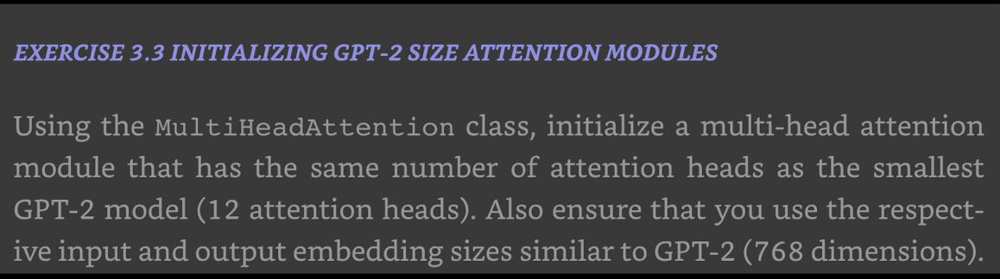